## Stable Diffusion Inference Optimization
This notebook demonstrates inference with Stable Diffusion v1.5 before and after performing optimizations. The optimizations used can be found in the ```config.yaml``` file in the top-level directory.

In [1]:
import torch
from diffusers import StableDiffusionPipeline

First, we create helper functions to display generated images and time the inference:

In [2]:
from PIL import Image

#Helper function to display image grid
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

#Decorator function to time events
def benchmark_timer(n_reps):
    def _decorator(func):
        def inner(*args, **kwargs):
            start, end = torch.cuda.Event(enable_timing=True), torch.cuda.Event(enable_timing=True)
            start.record()
            res = func(*args, **kwargs)
            end.record()
            torch.cuda.synchronize()
            benchmark_res = ((start.elapsed_time(end))/n_reps)/1000
            print(f'[*] Number of Reps: {n_reps}, Elapsed time (per rep): {benchmark_res} s')
            return res, benchmark_res
        return inner
    return _decorator

Use GPU (if available):

In [3]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

cuda


### Load base Stable Diffusion Pipeline
Here, we load a base pipeline with default components (no optimizations). The prompts and inference config is provided below for reference. All images are generated with 30 inference steps and 512x512 image resolution (default)

In [4]:
MODEL_CKPT = 'runwayml/stable-diffusion-v1-5'

prompts = [
    "a photo of an astronaut riding a horse on mars",
    "A high tech solarpunk utopia in the Amazon rainforest",
    "A pikachu fine dining with a view to the Eiffel Tower",
    "A mecha robot in a favela in expressionist style",
    "an insect robot preparing a delicious meal",
    "A small cabin on top of a snowy mountain in the style of Disney, artstation",
]

pipe_config = {
    "height": 512,
    "width": 512,
    "negative prompt": "ugly, deformed",
    "num_images_per_prompt": 1,
    "num_inference_steps": 30,
    "guidance_scale": 7.5
}

#Create base pipeline with no optimizations
base_pipe = StableDiffusionPipeline.from_pretrained(MODEL_CKPT, torch_dtype=torch.float32)
base_pipe.to(device)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.24.0",
  "_name_or_path": "runwayml/stable-diffusion-v1-5",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

**Generate the images using the pipeline**:

In [5]:
@benchmark_timer(len(prompts)*pipe_config['num_images_per_prompt'])
def base_inference(pipe, rng, prompts, inference_config):
    gen_imgs = []
    with torch.inference_mode():
        for prompt in prompts:
            images = base_pipe(
                prompt=prompt,
                generator=rng,
                **pipe_config
            ).images
            gen_imgs.extend(images)
    return gen_imgs

rng = torch.Generator(device=device) #Generator for seed
seed = 1998
rng.manual_seed(seed)
gen_imgs, _ = base_inference(base_pipe, rng, prompts, pipe_config)

print('[*] Generated images: ', len(gen_imgs))

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

[*] Number of Reps: 6, Elapsed time (per rep): 14.173666666666666 s
[*] Generated images:  6


**Visualize the generated images**:

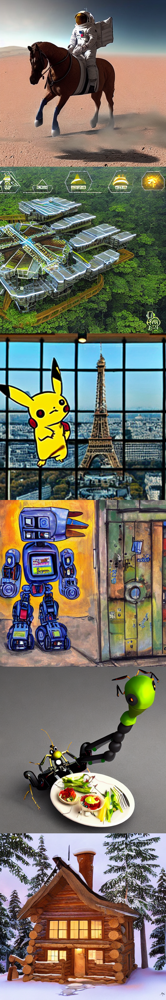

In [6]:
image_grid(gen_imgs, 6, 1)

**Calculate CLIP score**:

CLIP score represents the cosine similarity (dot product) between the image features and text features encoded by the CLIP model

In [7]:
from tools.benchmark_tools import calculate_clip_score

In [8]:
import numpy as np

images_np = np.stack([np.array(img) for img in gen_imgs])
sd_clip_score = calculate_clip_score(images_np, prompts)
print(f"CLIP score: {sd_clip_score}")

CLIP score: 30.9895


In [9]:
#Clear GPU memory
import gc

del base_pipe
gc.collect()
torch.cuda.empty_cache()

### Load Optimized Stable Diffusion Pipeline
Now, we load the optimized version of the StableDiffusionPipeline as observed by our benchmark experiments. The following optimizations are present:
- Reduced Precision (fp16)
- Token Merging (merging ratio 0.5)
- Distilled Stable Diffusion UNet (323M params vs 860M in normal pipeline)
- Tiny AutoEncoder (2.4M params vs 80M in normal pipeline)
- JIT Compilation (compiled UNet)

In [10]:
from tools.sdPipelineBuilder import getSDPipeline

optimized_pipe = getSDPipeline()
optimized_pipe.to(device)

unet/diffusion_pytorch_model.safetensors not found


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.24.0",
  "_name_or_path": "segmind/tiny-sd",
  "feature_extractor": [
    null,
    null
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": false,
  "safety_checker": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "DPMSolverMultistepScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "torch",
    "OptimizedModule"
  ],
  "vae": [
    "torch",
    "OptimizedModule"
  ]
}

**Generate images using the pipeline**:

Note that we are running a warm-up step to build the compilation graph (as the UNet is compiled)

In [11]:
from tools.benchmark_tools import generate_images

#Run one inference to build graph since we have JIT compiled the model

print('[*] JIT Compile, running inference to build graph...')
with torch.inference_mode():
    _ = optimized_pipe(
            prompt=prompts[0],
            generator=rng,
            **pipe_config
    )

#Perform Inference
new_gen_imgs, _ = generate_images(
    sdPipeline=optimized_pipe,
    device=device,
    rng=rng)

[*] JIT Compile, running inference to build graph...


  0%|          | 0/30 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

[*] Number of Reps: 6, Elapsed time (per rep): 2.1212960611979166 s


**Calculate CLIP score**:

In [12]:
new_images_np = np.stack([np.array(img) for img in new_gen_imgs])
new_sd_clip_score = calculate_clip_score(new_images_np, prompts)
print(f"CLIP score: {new_sd_clip_score}")

CLIP score: 29.8026


#### Visualize Images from both pipelines side-by-side

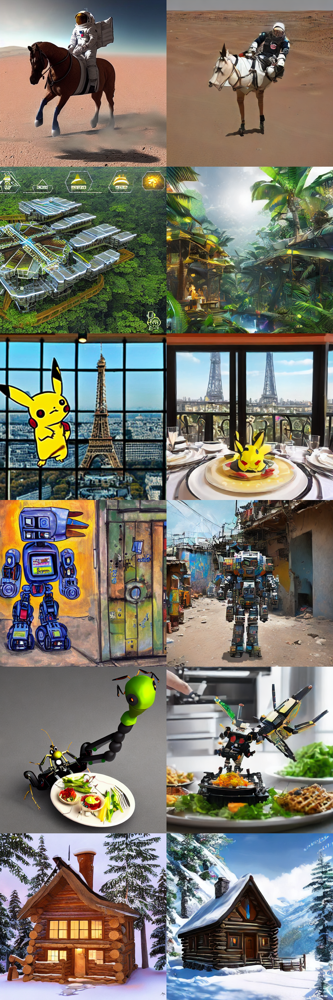

In [13]:
combined_imgs = [item for pair in zip(gen_imgs, new_gen_imgs) for item in pair]
image_grid(combined_imgs, 6, 2)